In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [27]:
folder = 'z12'

In [3]:
%cd /content/drive/MyDrive/Colab_Notebooks/Eye_images/New_images/

/content/drive/MyDrive/Colab_Notebooks/Eye_images/New_images


# About

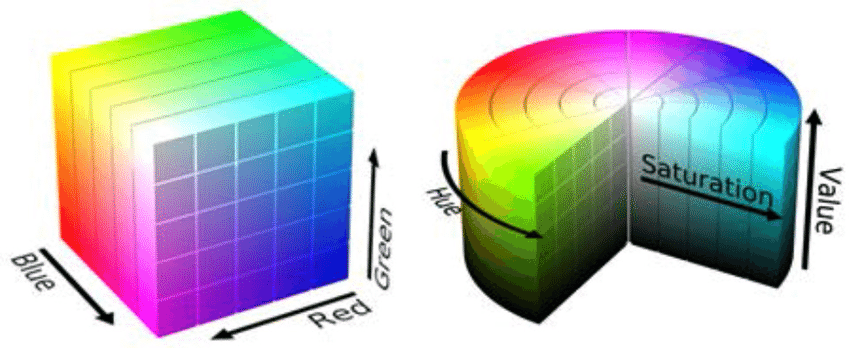

ОРИЕНТИРУЕМСЯ ДЕЛЯ ЗНАЧЕНИЕ ДЛЯ НАШЕГО ЦВЕТА НА 2

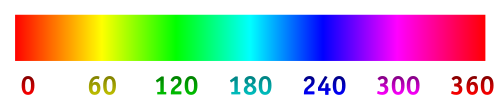


* Hue — цветовой тон, (например, красный, зелёный или сине-голубой). Варьируется в пределах 0—360°, однако иногда приводится к диапазону 0—100 или 0—1. **ЗДЕСЬ В ПРЕДЕЛАХ 0-179**
* Saturation — насыщенность. Варьируется в пределах 0—100 или 0—1. Чем больше этот параметр, тем «чище» цвет, поэтому этот параметр иногда называют чистотой цвета. А чем ближе этот параметр к нулю, тем ближе цвет к нейтральному серому. **ЗДЕСЬ В ПРЕДЕЛАХ 0-255**
* Value (значение цвета) или Brightness — яркость. Также задаётся в пределах 0—100 или 0—1. **ЗДЕСЬ В ПРЕДЕЛАХ 0-255**
У нас есть .png изображение, это трехмерный нумпай массив (число строк, число столбцов, число каналов). Число каналов в этом расширении = 4, первые три отвечают за rgb составляющие цвета, последний канал отвечает за прозрачность (0 - полностью прозрачный пиксель, 255 - полностью непрозрачный). В предыдущей функции imconvert мы отделяем метки патологий от других пикселей на изображении глазного дна так, что метки становятся единственными непрозрачными пикселями на изображениях. В следующей функции count_pixels мы считаем количество пикселей на метках с помощью подсчета непрозрачных пикселей на альфа-канале изображения. Все пиксели делим на 4 группы TP, TN, FP, FN. Дальше мы группируем эти измерения в метрики. 

Функция получает на вход исходное изображение, с которым необходимо сравнивать все остальные изображения и словарь с оставшимися искаженными изображениями детекции патологий.

Изначально мы обрабатываем альфа-канал исходного изображения и подсчитываем число пикселей на картине неискаженной детекции.

Далее мы начинаем обрабатывать искаженные изображения через маскирование и комбинации с исходным изображением:

1) False Negatives:

Берем искаженную картинку детекции и инвертируем ее, делая прозрачной только саму область детекции, а все остальные пиксели непрозрачными - это маска.
Далее мы накладываем эту маску на исходное изображение детекции. Маска у нас необычная, в данном случае прозрачные пиксели соответствующие искаженной детекции в маске представляются черными, то есть они отображают ту область, которая не отобразится на нашем исходном изображении. А отобразятся на нем только те **пиксели, которые мы не нашли на искаженной картинке, а должны были.**


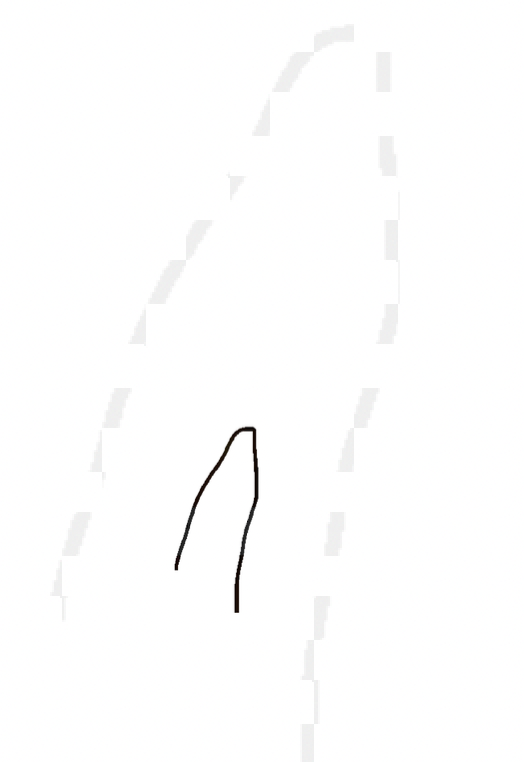

2) True Positives:

Мы берем False Negatives в качестве маски и применяем ее к исходному изображению, таким образом мы получаем те пиксели из изображения исходной детекции, которые мы правильно характеризовали как патологические с помощью детекции на искаженном изображении.

3) False Positives:

Здесь мы повторяем ту же схему, которую мы проводили в пункте 1, только меняем исходное изображение на изоблражение из массива и наоборот.

4) True Negatives:

Этих пикселей всегда будет очень много, надо как-то продумать этот момент. Для начала необходио удалить все черные пиксели за пределами изображения глазного дна, затем убрать пиксели, соответствующие картине детекции на исходном изображении. Это будет исходная картина, которая будет обрабатываться для каждого изображения искаженной детекции из массива. Так, мы удаляем все пиксели, соответствующие детекции на искаженном изображении, с этой нашей заготовки, и получаем все пиксели, которые правильно не задетектировались на искаженных картинках. (Надо подумать как быть с размытием границ на искаженных изображениях)

# Colour processing preparation

Вручную достаем значения для цветовых диапазонов для каждого типа меток, с помощью функции извлекаем метки из каждого изображения, записываем их в отдельный файл

green - h: (77)100-102(103) degr; s: (96)98-100%; v: (62)80-81(83)%

red - h: (342)346-349,5(357); s: (80)90-95(97)(100)%; v: (80)(83)91-100%

grey - h: 21 - 46 s: (12.1)13-19(27)(30)% v: (71.8)92-100%

yellow - h: 45 - это макула (41)51-59 s: (95)98-100% v: (90)96-100%

black h:(0) 356.9 - 358.5 (20.9) s: 49 - 81.7 v: 24.3 - 42.7

greyblack h: (2.7) 314 - 357.1 (13.3) s: (13.8)15 - (15)46.5 v: 26.3(62.4) - 52.2(71.7)

yellowgrey h: (50.5)=57.2 - (56.6)58.3 s: (38.3)=77.8 - (70.2)84(92.4) v: (97.3)99.2 - (98.8)99.6

yellowblack h: (39.7)55.1 - (57.3)58 s: (45.8)91.2 - (93.5)98.2 v: (37.3)79.6 - (80)86.3

yellowgreyblack h: s: v: (неотличим от yellowblack)

blue h: (126.3)(204.5) 186.7 - 196.6 (235.2) s: (14.5)(30.9) 65.0 - =83.1 (54.4) v: (51.4) 74.9 - 83.1 (70.6)

redblue h: (245.0) 319.5 - 341.4 (306.8) s: (29.9) 51.9 - 87.4 (41.9) v: (56.5) 62.7 - 87.1 (62.7)

greyblue h: 93.3 - 192.6 s: 4.1 - 81 v: 85.5 - 96.5

In [4]:
def colour_conv(array):
  new_array = np.array([array[0] / 2, np.floor(array[1] * 255) / 100, np.ceil(array[2] * 255) / 100])
  return new_array

In [5]:
def imconvert(image, show, *, test = 0, filename = 0, background = 0, colour = 0): #сделать возможность использовать функцию в разных mode (background/colour)
  
  hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

##ONLY BACKGROUND WORK
  if background == 1:
    
    background_pixels = 0

    lower_edge = np.array([0, 0, 0])
    upper_edge = np.array([179, 255, 25])

    back_mask = cv2.inRange(hsv, lower_edge, upper_edge)
    background = cv2.bitwise_and(image, image, mask = back_mask)

    background_alpha_channel = background[:,:,3]

    for i in range(background_alpha_channel.shape[0]): 
      for j in range(background_alpha_channel.shape[1]): 
        if background_alpha_channel[i][j] != 0:
          background_pixels += 1
    
    if show != 0:

      cv2_imshow(background)

    if filename != 0:

      cv2.imwrite(filename, background)

    return background_pixels
##END OF BACKGROUND WORK

##COLOURS
  if colour == 'green':
    lower_edge = colour_conv([77, 96, 62])
    upper_edge = colour_conv([103, 100, 83])

  elif colour == 'red':
    lower_edge = colour_conv([342, 80, 80])
    upper_edge = colour_conv([357, 100, 100])

  elif colour == 'grey':
    lower_edge = colour_conv([21, 9, 71.8])
    upper_edge = colour_conv([46, 30, 100])

  elif colour == 'yellow':
    lower_edge = colour_conv([41, 95, 90])
    upper_edge = colour_conv([59, 100, 100])

  elif colour == 'black':
    lower_edge1 = colour_conv([0, 49, 24.3])
    upper_edge1 = colour_conv([20.9, 81.7, 42.7])
    
    mask1 = cv2.inRange(hsv, lower_edge1, upper_edge1)
    result1 = cv2.bitwise_and(image, image, mask = mask1)

    lower_edge = colour_conv([356.9, 49, 24.3])
    upper_edge = colour_conv([358.5, 81.7, 42.7])

  elif colour == 'greyblack':
    lower_edge1 = colour_conv([2.7, 13.8, 62.4])
    upper_edge1 = colour_conv([13.3, 15, 71.7])
    
    mask1 = cv2.inRange(hsv, lower_edge1, upper_edge1)
    result1 = cv2.bitwise_and(image, image, mask = mask1)

    lower_edge = colour_conv([314, 15, 26.3])
    upper_edge = colour_conv([357.1, 46.5, 52.2])

  elif colour == 'yellowgrey':
    lower_edge1 = colour_conv([50.5, 38.3, 97.3])
    upper_edge1 = colour_conv([56.6, 92.4, 98.8])
    
    mask1 = cv2.inRange(hsv, lower_edge1, upper_edge1)
    result1 = cv2.bitwise_and(image, image, mask = mask1)

    lower_edge = colour_conv([57.2, 77.8, 99.2])
    upper_edge = colour_conv([58.3, 84, 99.6])

  elif colour == 'yellowblack':
    lower_edge1 = colour_conv([39.7, 45.8, 37.3])
    upper_edge1 = colour_conv([57.3, 93.5, 80])
    
    mask1 = cv2.inRange(hsv, lower_edge1, upper_edge1)
    result1 = cv2.bitwise_and(image, image, mask = mask1)

    lower_edge = colour_conv([55.1, 91.2, 79.6])
    upper_edge = colour_conv([58, 98.2, 86.3])

  elif colour == 'blue':
    lower_edge1 = colour_conv([113.3, 14.5, 51.4])
    upper_edge1 = colour_conv([235.2, 66, 77.3]) #

    mask1 = cv2.inRange(hsv, lower_edge1, upper_edge1)
    result1 = cv2.bitwise_and(image, image, mask = mask1)

    lower_edge = colour_conv([184.6, 65, 69]) #74.9
    upper_edge = colour_conv([196.6, 83.1, 84]) #

  elif colour == 'redblue':
    lower_edge1 = colour_conv([245, 29.9, 56.5])
    upper_edge1 = colour_conv([306.8, 41.9, 62.7])
    
    mask1 = cv2.inRange(hsv, lower_edge1, upper_edge1)
    result1 = cv2.bitwise_and(image, image, mask = mask1)

    lower_edge = colour_conv([319.5, 51.9, 62.7])
    upper_edge = colour_conv([341.4, 87.4, 87.1])

  elif colour == 'greyblue':
    lower_edge = colour_conv([93.3, 4.1, 85.5])
    upper_edge = colour_conv([192.6, 81, 96.5])

  else: return "Can't find your colour in base, check the name"

##MAIN MASKING
  mask = cv2.inRange(hsv, lower_edge, upper_edge)
  result = cv2.bitwise_and(image, image, mask = mask)

##COMPRESSING BOTH MASKING RESULTS INTO ONE IF NECESSARY
  if 'result1' in locals():
    res = result + result1
  else:
    res = result

##SHOWING RESULTS
  if show != 0:

    cv2_imshow(image)
    cv2_imshow(res)

##SAVING
  if test != 0:
    
    test_for_masking = image - res

    cv2.imwrite('mask_test.png', test_for_masking)

    if show != 0:
      
      cv2_imshow(test_for_masking)

    return 


  if filename != 0:
    cv2.imwrite(filename, res)

  return

In [6]:
origin = cv2.imread('62t.png', cv2.IMREAD_UNCHANGED)

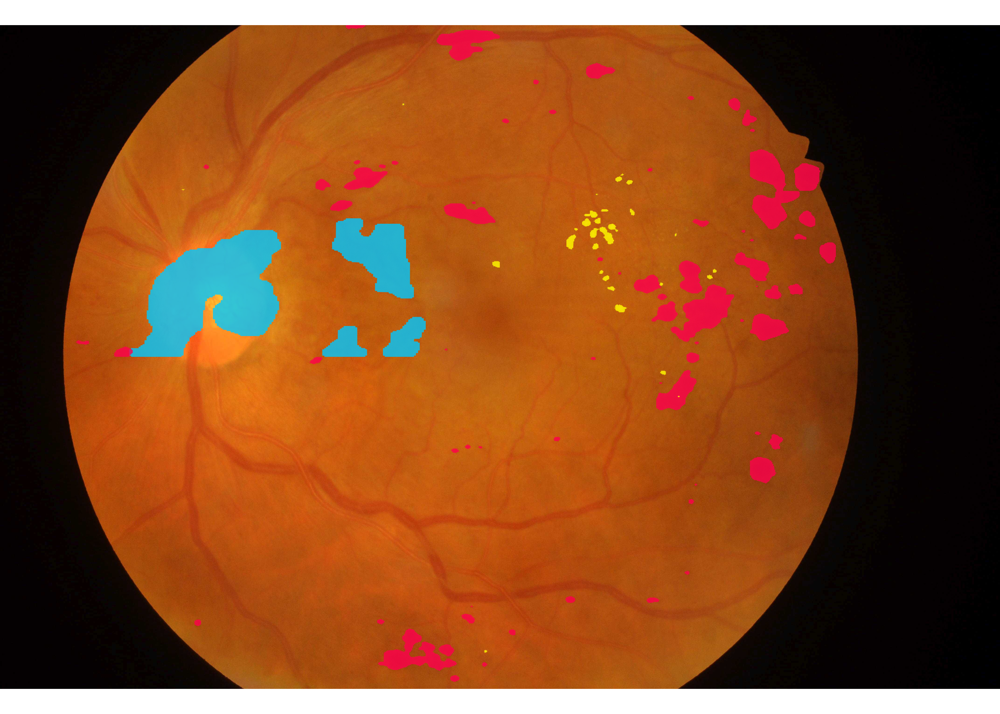

In [7]:
cv2_imshow(origin)

Просматриваем все изображения и выясняем какие цвета меток есть в этом наборе

In [8]:
colours = ['green', 'yellow', 'red', 'redblue', 'blue', 'grey', 'greyblue']

In [9]:
base_colours = ['blue', 'red', 'yellow', 'green', 'grey']

In [10]:
print(origin.shape, 'Pixels = ', origin.shape[0] * origin.shape[1])

(2103, 2943, 4) Pixels =  6189129


In [28]:
for i in range(len(colours)):
  imconvert(origin, 0, filename = folder + '_origin_labels_{0}.png'.format(colours[i]), colour = colours[i])

# Source image labels all colours unification

Поскольку при наложении меток различных цветов на изображении образуется новый цвет, необходимо объединить файлы с метками конкретного цвета с файлами меток производных цветов в один для дальнейшего подсчета пикселей

In [29]:
colour_unification = dict()

for i in range(len(base_colours)):
  subcolours = []
  for j in range(len(colours)):
    if base_colours[i] in colours[j]:
      subcolours.append(colours[j])
  colour_unification[base_colours[i]] = {'subcolours': subcolours}

In [30]:
colour_unification

{'blue': {'subcolours': ['redblue', 'blue', 'greyblue']},
 'green': {'subcolours': ['green']},
 'grey': {'subcolours': ['grey', 'greyblue']},
 'red': {'subcolours': ['red', 'redblue']},
 'yellow': {'subcolours': ['yellow']}}

In [31]:
colours_for_countpixels = []
for i in range(len(base_colours)):
  if len(colour_unification[base_colours[i]]['subcolours']) != 0:

    colour_unification[base_colours[i]]['label_pics'] = []

    for k in range(len(colour_unification[base_colours[i]]['subcolours'])):
      colour_unification[base_colours[i]]['label_pics'].append(cv2.imread(folder + '_origin_labels_{0}.png'.format(colour_unification[base_colours[i]]['subcolours'][k]), cv2.IMREAD_UNCHANGED))

    total = colour_unification[base_colours[i]]['label_pics'][0]
    for j in range(len(colour_unification[base_colours[i]]['label_pics']) - 1):
      total += colour_unification[base_colours[i]]['label_pics'][j + 1]

    cv2.imwrite(folder + '_origin_labels_{0}_united.png'.format(base_colours[i]), total)

    print(base_colours[i] + 's are now united,', '{0} colours joined together'.format(k+1)) 
    
    colours_for_countpixels.append(base_colours[i])

  else: print('nothing to unite in {0}'.format(base_colours[i]))

blues are now united, 3 colours joined together
reds are now united, 2 colours joined together
yellows are now united, 1 colours joined together
greens are now united, 1 colours joined together
greys are now united, 2 colours joined together


In [ ]:
colours_for_countpixels

['blue', 'red', 'yellow', 'green', 'grey']

# Source image labels preparation for pixel count function

In [32]:
orig_sorted_labels = dict()
for i in range(len(colours_for_countpixels)):
  orig_sorted_labels[colours_for_countpixels[i]] = cv2.imread(folder + '_origin_labels_{0}_united.png'.format(colours_for_countpixels[i]), cv2.IMREAD_UNCHANGED)

# Distorted images preparation for pixel count function

In [37]:
#читаем исходные искаженные изображения
names = ['-03', '-06', '-09', '-12', '-15', '-18', '-21', '-24', '-27', '-30']

images = []

i = 0 
for name in names:
  images.append(cv2.imread(folder + name + '.png', cv2.IMREAD_UNCHANGED))
  i += 1

In [35]:
len(images)

10

In [38]:
#выделяем из этих изображений разноцветные метки и сохраняем их в отдельные файлы
for i in range(len(images)):
  for j in range(len(colours)):
    imconvert(images[i], 0, filename = folder + '_image{0}mkm_{1}_labels.png'.format(names[i], colours[j]), colour = colours[j])

#Distorted images labels all colours unification

In [39]:
distorted_colour_unification = dict()
supp = dict()

for i in range(len(base_colours)):
  subcolours = []
  for j in range(len(colours)):
    if base_colours[i] in colours[j]:
      subcolours.append(colours[j])
  supp[base_colours[i]] = {'subcolours': subcolours}

for k in range(len(names)):
  distorted_colour_unification[names[k]] = supp

In [41]:
for l in range(len(names)):
  for i in range(len(base_colours)):
    if len(distorted_colour_unification[names[l]][base_colours[i]]['subcolours']) != 0:

      distorted_colour_unification[names[l]][base_colours[i]]['label_pics'] = []

      for k in range(len(distorted_colour_unification[names[l]][base_colours[i]]['subcolours'])):
        distorted_colour_unification[names[l]][base_colours[i]]['label_pics'].append(cv2.imread(folder + '_image{0}mkm_{1}_labels.png'.format(names[l], distorted_colour_unification[names[l]][base_colours[i]]['subcolours'][k]), cv2.IMREAD_UNCHANGED))

      total = distorted_colour_unification[names[l]][base_colours[i]]['label_pics'][0]
      for j in range(len(distorted_colour_unification[names[l]][base_colours[i]]['label_pics']) - 1):
        total += distorted_colour_unification[names[l]][base_colours[i]]['label_pics'][j + 1]

      cv2.imwrite(folder + '_image{0}mkm_{1}_united_labels.png'.format(names[l], base_colours[i]), total)

      print(names[l], 'mkm', base_colours[i] + 's are now united,', '{0} colours joined together'.format(k+1)) 

    else: print('nothing to unite in {0} {1} labels'.format(names[l], base_colours[i]))
  print('\n')

-03 mkm blues are now united, 3 colours joined together
-03 mkm reds are now united, 2 colours joined together
-03 mkm yellows are now united, 1 colours joined together
-03 mkm greens are now united, 1 colours joined together
-03 mkm greys are now united, 2 colours joined together


-06 mkm blues are now united, 3 colours joined together
-06 mkm reds are now united, 2 colours joined together
-06 mkm yellows are now united, 1 colours joined together
-06 mkm greens are now united, 1 colours joined together
-06 mkm greys are now united, 2 colours joined together


-09 mkm blues are now united, 3 colours joined together
-09 mkm reds are now united, 2 colours joined together
-09 mkm yellows are now united, 1 colours joined together
-09 mkm greens are now united, 1 colours joined together
-09 mkm greys are now united, 2 colours joined together


-12 mkm blues are now united, 3 colours joined together
-12 mkm reds are now united, 2 colours joined together
-12 mkm yellows are now united, 1 col

#Distorted images labels prep for pixel count

In [42]:
#читаем файлы с метками и сохраняем их в словарь из списков по цветам: красный - 10 изображений, итд
sorted_labels = dict()
for i in range(len(colours_for_countpixels)):
  labels = []
  for j in range(len(names)):
    labels.append(cv2.imread(folder + '_image{0}mkm_{1}_united_labels.png'.format(names[j], colours_for_countpixels[i]), cv2.IMREAD_UNCHANGED))
  sorted_labels[colours_for_countpixels[i]] = labels

#Count_pixels function

In [43]:
def count_pixels(orig_image, label_colours, reference_labels, labels, *, filename = 0):

  from tqdm import tqdm

  rows = orig_image.shape[0] #потом для оптимизации работы можно эти значения вставить во все циклы где используется .shape так как везде размерности одинаковые
  cols = orig_image.shape[1]

  background_pixels = imconvert(orig_image, 0, background = 1)

  total_pixels = rows * cols

  a = 0
  reference_label_alpha_channel = dict()
  reference_label_pixels = dict()

  for value in reference_labels.values():

    reference_label_alpha_channel[label_colours[a]] = value[:,:,3]

    reference_label_pixels[label_colours[a]] = 0

    for i in range(reference_label_alpha_channel[label_colours[a]].shape[0]): 
      for j in range(reference_label_alpha_channel[label_colours[a]].shape[1]): 
          if reference_label_alpha_channel[label_colours[a]][i][j] != 0:
            reference_label_pixels[label_colours[a]] += 1
   
    a += 1

#  cv2_imshow(reference_labels)
  colour_of_distorted_image_label = dict()

  for l in tqdm(range(len(label_colours))):

    distorted_image_labels = []

    for i in range(len(labels[label_colours[l]])):

      distorted_image_labels_parameters = dict()

      #FALSE NEGATIVES
      FN_mask = cv2.bitwise_not(labels[label_colours[l]][i])                # вычисляем изображение, обратное картине искаженной детекции
      FN_4_channels = cv2.bitwise_and(reference_labels[label_colours[l]], FN_mask)  # FN_4_channels вычисляем след картины искаженной детекции на картине детекции без искажений

      FN_alpha = FN_4_channels[:,:,3]
      FN_pixels = 0
      for j in range(FN_alpha.shape[0]): 
        for k in range(FN_alpha.shape[1]): 
          if FN_alpha[j][k] != 0:
            FN_pixels += 1
      distorted_image_labels_parameters['FN'] = FN_pixels

      #TRUE POSITIVES
      TP_mask = cv2.bitwise_not(FN_4_channels)              # теперь в качестве маски выступают пиксели, которые остались от оригинального изображения после того, как все остальные были убраны наложением искаженного
      TP_4_channels = cv2.bitwise_and(reference_labels[label_colours[l]], TP_mask)  # TP_4_channels получаем только те пиксели, которые совпадают у исходного изображения и искаженного
  
      TP_alpha = TP_4_channels[:,:,3]
      TP_pixels = 0
      for j in range(TP_alpha.shape[0]): 
        for k in range(TP_alpha.shape[1]): 
          if TP_alpha[j][k] != 0:
            TP_pixels += 1
      distorted_image_labels_parameters['TP'] = TP_pixels

      #FALSE POSITIVES
      FP_mask = cv2.bitwise_not(reference_labels[label_colours[l]])
      FP_4_channels = cv2.bitwise_and(labels[label_colours[l]][i], FP_mask)

      FP_alpha = FP_4_channels[:,:,3]
      FP_pixels = 0
      for j in range(FP_alpha.shape[0]): 
        for k in range(FP_alpha.shape[1]): 
          if FP_alpha[j][k] != 0:
            FP_pixels += 1
      distorted_image_labels_parameters['FP'] = FP_pixels

      #TRUE NEGATIVES
      TN_pixels = total_pixels - background_pixels - FP_pixels - TP_pixels - FN_pixels
      distorted_image_labels_parameters['TN'] = TN_pixels

      #metrics
      if (TP_pixels + FP_pixels) != 0:
        distorted_image_labels_parameters['Precision'] = TP_pixels / (TP_pixels + FP_pixels)
      else:
        distorted_image_labels_parameters['Precision'] = -0.1
      if (TP_pixels + FN_pixels) != 0:
        distorted_image_labels_parameters['Recall'] = TP_pixels / (TP_pixels + FN_pixels)
      else:
        distorted_image_labels_parameters['Recall'] = -0.1
      if (TN_pixels + FP_pixels) != 0:
        distorted_image_labels_parameters['Specificity'] = TN_pixels / (TN_pixels + FP_pixels)
      else:
        distorted_image_labels_parameters['Specificity'] = -0.1

      distorted_image_labels_parameters['Registered_pixels'] = TP_pixels + FP_pixels

      distorted_image_labels_parameters['Reference_pixels'] = reference_label_pixels[label_colours[l]]

      distorted_image_labels_parameters['Name'] = 'image_(-{0}mkm)_{1}'.format(round(0.3 * (i + 1), 1), label_colours[l])

      distorted_image_labels.append(distorted_image_labels_parameters) #добавляем словарь с информацией о пикселях в общи   массив

    colour_of_distorted_image_label[label_colours[l]] = distorted_image_labels

# metrics for combined colours

#  correlation = []

#  for image in distorted_image_labels:
#    if image['TP'] != 0:
#      correlation.append(round(image['TP']/reference_label_pixels, 4))
#    else:
#      correlation.append(-1)

#  print('Reference label pixel number = ', reference_label_pixels,'\n')


  for key, value in colour_of_distorted_image_label.items():

    print('\n', 'Colour of the label:', key)
    print('Number of pixels in reference label:', reference_label_pixels[key])
    print('Distorted labels pixels parameters:', '\n')
    
    for i in range(len(value)):

      print('{0}:'.format(value[i]['Name']), '\t', 
            'TP:', value[i]['TP'], '\t', 
            'FN:', value[i]['FN'], '\t', 
            'FP:', value[i]['FP'], '\t', 
            'TN:', value[i]['TN'], '\n', '\t', 
            'Precision:', round(value[i]['Precision'], 4), '\t', 
            'Recall:', round(value[i]['Recall'], 4), '\t',
            'Registered pixels:', value[i]['Registered_pixels'], '\t', 
            'Reference pixels:', value[i]['Reference_pixels'], '\t',
            'Specificity', round(value[i]['Specificity'], 4), '\n')

  print('Background pixel number:', background_pixels)
  print('Total pixel number:', total_pixels)

  if filename != 0:
    import json
    json.dump(colour_of_distorted_image_label, open(folder + '_' + filename + '.json', 'w'))
  
  return colour_of_distorted_image_label

#Labels processing

In [44]:
colours_for_countpixels

['blue', 'red', 'yellow', 'green', 'grey']

In [ ]:
version = 0

In [ ]:
%%time
resulting_parameters = count_pixels(origin, colours_for_countpixels, orig_sorted_labels, sorted_labels, filename = 'resulting_parameters_vol_{0}'.format(version))
version += 1

100%|██████████| 5/5 [24:23<00:00, 292.65s/it]



 Colour of the label: red
Number of pixels in reference label: 28055
Distorted labels pixels parameters: 

image_(-0.3mkm)_red: 	 TP: 25303 	 FN: 2752 	 FP: 3174 	 TN: 3566060 
 	 Precision: 0.8885 	 Recall: 0.9019 	 Registered pixels: 28477 	 Reference pixels: 28055 	 Specificity 0.9991 

image_(-0.6mkm)_red: 	 TP: 18132 	 FN: 9923 	 FP: 2710 	 TN: 3566524 
 	 Precision: 0.87 	 Recall: 0.6463 	 Registered pixels: 20842 	 Reference pixels: 28055 	 Specificity 0.9992 

image_(-0.9mkm)_red: 	 TP: 11636 	 FN: 16419 	 FP: 2286 	 TN: 3566948 
 	 Precision: 0.8358 	 Recall: 0.4148 	 Registered pixels: 13922 	 Reference pixels: 28055 	 Specificity 0.9994 

image_(-1.2mkm)_red: 	 TP: 7892 	 FN: 20163 	 FP: 1665 	 TN: 3567569 
 	 Precision: 0.8258 	 Recall: 0.2813 	 Registered pixels: 9557 	 Reference pixels: 28055 	 Specificity 0.9995 

image_(-1.5mkm)_red: 	 TP: 3902 	 FN: 24153 	 FP: 903 	 TN: 3568331 
 	 Precision: 0.8121 	 Recall: 0.1391 	 Registered pixels: 4805 	 Reference pixels: 28055

# Plotting

## Metrics comparison variant 1

In [ ]:
folders = ['z3', 'z4', 'z6', 'z7', 'z12', 'z12plus']

In [ ]:
import json

multiple_data = dict()

for folder in folders:
  multiple_data[folder] = json.load(open(folder + '_resulting_parameters_vol_0.json'))

In [ ]:
im_names = []
for i in range(len(multiple_data['z3']['green'])):
  im_names.append('-{0}_mkm'.format(round(0.3 * (i + 1), 1)))

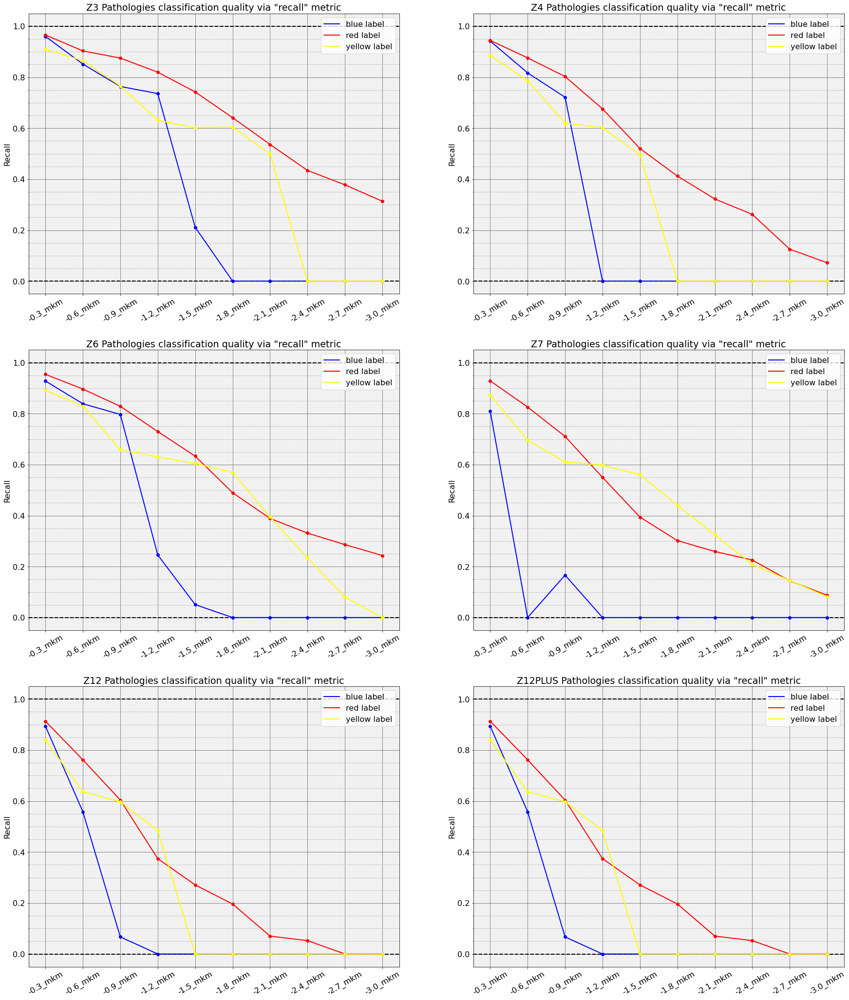

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as tck

font = {'weight' : 'normal',
        'size'   : 16}

plt.rc('font', **font)

plotrows = 3
plotcols = 2

f = plt.figure(figsize = (plotcols * 15, plotrows * 12))
rot_angle = 30

plot_n = 0

for z_number, z_dataset in multiple_data.items():

  plot_n += 1
  ax = f.add_subplot(plotrows, plotcols, plot_n)
  ax.set_title(z_number.upper() + ' ' + 'Pathologies classification quality via "recall" metric')
  ax.set_ylabel('Recall')
  ax.set_xticklabels(im_names, rotation = rot_angle)
  ax.grid(which = 'major', color = '#666666')
  ax.set_facecolor('#F1F1F1')
  ax.yaxis.set_minor_locator(tck.AutoMinorLocator())
  ax.grid(which = 'minor', linestyle = 'dashed')
  ax.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')
  ax.axhline(0.0, color = 'black', linewidth = 2, linestyle = 'dashed')

  #for j in range(len(colours_for_countpixels)):
  for colour, data in z_dataset.items():

    recall = []
    precision = []
    specificity = []
    TP = []
    FP = []
    FN = []
    registered_pixels = []
    reference_pixels = []
    ratio = []
    ratio_2 = []

    #for i in range(len(z_dataset[colou-rs_for_countpixels[j]])):
    for i in range(len(data)):


      recall.append(data[i]['Recall'])
      precision.append(data[i]['Precision'])
      if data[i]['Specificity'] == 1:
        specificity.append(data[i]['Specificity'] + 0.002)
      else:
        specificity.append(data[i]['Specificity'])
      TP.append(data[i]['TP'])
      FP.append(data[i]['FP'])
      FN.append(data[i]['FN'])
      registered_pixels.append(data[i]['Registered_pixels'])
      reference_pixels.append(data[i]['Reference_pixels'])
      if data[i]['Reference_pixels'] != 0:
        ratio.append(data[i]['Registered_pixels']/data[i]['Reference_pixels'])
        ratio_2.append(data[i]['FP']/data[i]['Reference_pixels'])
      else:
        ratio.append(-0.1)
        ratio_2.append(-0.1)

    if (colour != 'green') and  (colour != "grey"):

      ax.plot(im_names, recall, 'o', color = colour)
      ax.plot(im_names, recall, color = colour, linewidth = 2, label = '{0} label'.format(colour))
      ax.legend(loc = 'upper right')



#plt.savefig(folder + '_plots_vol_{0}.pdf'.format(3))
#plt.savefig(folder + '_plots_vol_{0}.png'.format(3))

plt.show()

## Metrics comparison variant 2

In [ ]:
reds = ['#FF4343', '#FF9B31', '#FF0000', '#DF7300', '#BC0000', '#700000']
yellows = ['#FCFF42', '#FFB727', '#FFE400', '#DA9304', '#AD9D00', '#554D00']
blues = ['#38DDEB', '#34ABA0', '#1497E8', '#0648EC', '#6B06EC', '#21004C']

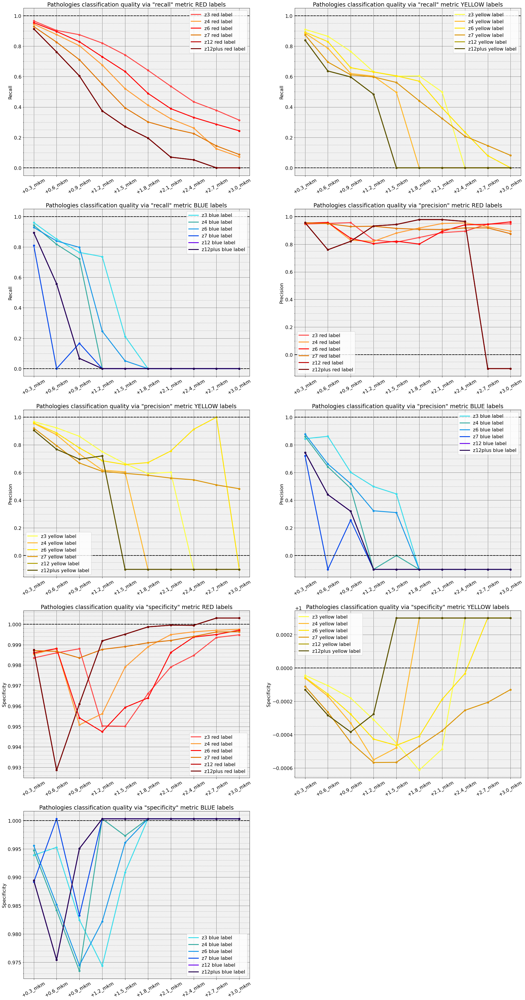

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as tck
import warnings
warnings.filterwarnings('ignore')

font = {'weight' : 'normal',
        'size'   : 16}

plt.rc('font', **font)

plotrows = 5
plotcols = 2

f = plt.figure(figsize = (plotcols * 15, plotrows * 12))
rot_angle = 30

plot_n = 0
colour_n = -1

for z_number, z_dataset in multiple_data.items():

  colour_n += 1
  #for j in range(len(colours_for_countpixels)):
  for colour, data in z_dataset.items():

    recall = []
    precision = []
    specificity = []
    TP = []
    FP = []
    FN = []
    registered_pixels = []
    reference_pixels = []
    ratio = []
    ratio_2 = []


    #for i in range(len(z_dataset[colou-rs_for_countpixels[j]])):
    for i in range(len(data)):

      recall.append(data[i]['Recall'])
      precision.append(data[i]['Precision'])

      if data[i]['Specificity'] == 1:
        specificity.append(data[i]['Specificity'] + 0.0003)
      else:
        specificity.append(data[i]['Specificity'])

      TP.append(data[i]['TP'])
      FP.append(data[i]['FP'])
      FN.append(data[i]['FN'])
      registered_pixels.append(data[i]['Registered_pixels'])
      reference_pixels.append(data[i]['Reference_pixels'])

      if data[i]['Reference_pixels'] != 0:
        ratio.append(data[i]['Registered_pixels']/data[i]['Reference_pixels'])
        ratio_2.append(data[i]['FP']/data[i]['Reference_pixels'])
      else:
        ratio.append(-0.1)
        ratio_2.append(-0.1)

    if colour == 'red':

      ax1 = f.add_subplot(plotrows, plotcols, 1)

      ax1.set_title('Pathologies classification quality via "recall" metric ' + colour.upper() + ' labels')
      ax1.set_ylabel('Recall')
      ax1.set_xticklabels(im_names, rotation = rot_angle)
      ax1.grid(which = 'major', color = '#666666')
      ax1.set_facecolor('#F1F1F1')
      ax1.yaxis.set_minor_locator(tck.AutoMinorLocator())
      ax1.grid(which = 'minor', linestyle = 'dashed')
      ax1.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')
      ax1.axhline(0.0, color = 'black', linewidth = 2, linestyle = 'dashed')

      ax1.plot(im_names, recall, linewidth = 3, color = reds[colour_n], label = z_number + ' {0} label'.format(colour))
      ax1.plot(im_names, recall, 'o', color = reds[colour_n])
      ax1.legend(loc = 'upper right')

      ax2 = f.add_subplot(plotrows, plotcols, 4)

      ax2.set_title('Pathologies classification quality via "precision" metric ' + colour.upper() + ' labels')
      ax2.set_ylabel('Precision')
      ax2.set_xticklabels(im_names, rotation = rot_angle)
      ax2.grid(which = 'major', color = '#666666')
      ax2.set_facecolor('#F1F1F1')
      ax2.yaxis.set_minor_locator(tck.AutoMinorLocator())
      ax2.grid(which = 'minor', linestyle = 'dashed')
      ax2.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')
      ax2.axhline(0.0, color = 'black', linewidth = 2, linestyle = 'dashed')

      ax2.plot(im_names, precision, linewidth = 3, color = reds[colour_n], label = z_number + ' {0} label'.format(colour))
      ax2.plot(im_names, precision, 'o', color = reds[colour_n])
      ax2.legend(loc = 'lower left')

      ax3 = f.add_subplot(plotrows, plotcols, 7)

      ax3.set_title('Pathologies classification quality via "specificity" metric ' + colour.upper() + ' labels')
      ax3.set_ylabel('Specificity')
      ax3.set_xticklabels(im_names, rotation = rot_angle)
      ax3.grid(which = 'major', color = '#666666')
      ax3.set_facecolor('#F1F1F1')
      ax3.yaxis.set_minor_locator(tck.AutoMinorLocator())
      ax3.grid(which = 'minor', linestyle = 'dashed')
      ax3.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')

      ax3.plot(im_names, specificity, linewidth = 3, color = reds[colour_n], label = z_number + ' {0} label'.format(colour))
      ax3.plot(im_names, specificity, 'o', color = reds[colour_n])
      ax3.legend(loc = 'lower right')

    elif colour == 'yellow':

      ax4 = f.add_subplot(plotrows, plotcols, 2)

      ax4.set_title('Pathologies classification quality via "recall" metric ' + colour.upper() + ' labels')
      ax4.set_ylabel('Recall')
      ax4.set_xticklabels(im_names, rotation = rot_angle)
      ax4.grid(which = 'major', color = '#666666')
      ax4.set_facecolor('#F1F1F1')
      ax4.yaxis.set_minor_locator(tck.AutoMinorLocator())
      ax4.grid(which = 'minor', linestyle = 'dashed')
      ax4.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')
      ax4.axhline(0.0, color = 'black', linewidth = 2, linestyle = 'dashed')

      ax4.plot(im_names, recall, linewidth = 3, color = yellows[colour_n], label = z_number + ' {0} label'.format(colour))
      ax4.plot(im_names, recall, 'o', color = yellows[colour_n])
      ax4.legend(loc = 'upper right')

      ax5 = f.add_subplot(plotrows, plotcols, 5)

      ax5.set_title('Pathologies classification quality via "precision" metric ' + colour.upper() + ' labels')
      ax5.set_ylabel('Precision')
      ax5.set_xticklabels(im_names, rotation = rot_angle)
      ax5.grid(which = 'major', color = '#666666')
      ax5.set_facecolor('#F1F1F1')
      ax5.yaxis.set_minor_locator(tck.AutoMinorLocator())
      ax5.grid(which = 'minor', linestyle = 'dashed')
      ax5.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')
      ax5.axhline(0.0, color = 'black', linewidth = 2, linestyle = 'dashed')

      ax5.plot(im_names, precision, linewidth = 3, color = yellows[colour_n], label = z_number + ' {0} label'.format(colour))
      ax5.plot(im_names, precision, 'o', color = yellows[colour_n])
      ax5.legend(loc = 'lower left')

      ax6 = f.add_subplot(plotrows, plotcols, 8)

      ax6.set_title('Pathologies classification quality via "specificity" metric ' + colour.upper() + ' labels')
      ax6.set_ylabel('Specificity')
      ax6.set_xticklabels(im_names, rotation = rot_angle)
      ax6.grid(which = 'major', color = '#666666')
      ax6.set_facecolor('#F1F1F1')
      ax6.yaxis.set_minor_locator(tck.AutoMinorLocator())
      ax6.grid(which = 'minor', linestyle = 'dashed')
      ax6.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')

      ax6.plot(im_names, specificity, linewidth = 3, color = yellows[colour_n], label = z_number + ' {0} label'.format(colour))
      ax6.plot(im_names, specificity, 'o', color = yellows[colour_n])
      ax6.legend(loc = 'upper left')

    elif colour == 'blue':

      ax7 = f.add_subplot(plotrows, plotcols, 3)

      ax7.set_title('Pathologies classification quality via "recall" metric ' + colour.upper() + ' labels')
      ax7.set_ylabel('Recall')
      ax7.set_xticklabels(im_names, rotation = rot_angle)
      ax7.grid(which = 'major', color = '#666666')
      ax7.set_facecolor('#F1F1F1')
      ax7.yaxis.set_minor_locator(tck.AutoMinorLocator())
      ax7.grid(which = 'minor', linestyle = 'dashed')
      ax7.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')
      ax7.axhline(0.0, color = 'black', linewidth = 2, linestyle = 'dashed')

      ax7.plot(im_names, recall, linewidth = 3, color = blues[colour_n], label = z_number + ' {0} label'.format(colour))
      ax7.plot(im_names, recall, 'o', color = blues[colour_n])
      ax7.legend(loc = 'upper right')

      ax8 = f.add_subplot(plotrows, plotcols, 6)

      ax8.set_title('Pathologies classification quality via "precision" metric ' + colour.upper() + ' labels')
      ax8.set_ylabel('Precision')
      ax8.set_xticklabels(im_names, rotation = rot_angle)
      ax8.grid(which = 'major', color = '#666666')
      ax8.set_facecolor('#F1F1F1')
      ax8.yaxis.set_minor_locator(tck.AutoMinorLocator())
      ax8.grid(which = 'minor', linestyle = 'dashed')
      ax8.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')
      ax8.axhline(0.0, color = 'black', linewidth = 2, linestyle = 'dashed')

      ax8.plot(im_names, precision, linewidth = 3, color = blues[colour_n], label = z_number + ' {0} label'.format(colour))
      ax8.plot(im_names, precision, 'o', color = blues[colour_n])
      ax8.legend(loc = 'upper right')

      ax9 = f.add_subplot(plotrows, plotcols, 9)

      ax9.set_title('Pathologies classification quality via "specificity" metric ' + colour.upper() + ' labels')
      ax9.set_ylabel('Specificity')
      ax9.set_xticklabels(im_names, rotation = rot_angle)
      ax9.grid(which = 'major', color = '#666666')
      ax9.set_facecolor('#F1F1F1')
      ax9.yaxis.set_minor_locator(tck.AutoMinorLocator())
      ax9.grid(which = 'minor', linestyle = 'dashed')
      ax9.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')

      ax9.plot(im_names, specificity, linewidth = 3, color = blues[colour_n], label = z_number + ' {0} label'.format(colour))
      ax9.plot(im_names, specificity, 'o', color = blues[colour_n])
      ax9.legend(loc = 'lower right')

#plt.savefig('metric_comparison_vol_{0}.pdf'.format(1))
#plt.savefig(folder + '_plots_vol_{0}.png'.format(3))
plt.show()

## All plots for current folder

In [ ]:
import json

data = json.load(open(folder + '_resulting_parameters_vol_0.json'))

In [ ]:
im_names = []
for i in range(len(data['green'])):
  im_names.append('+{0}_mkm'.format(round(0.3 * (i + 1), 1)))

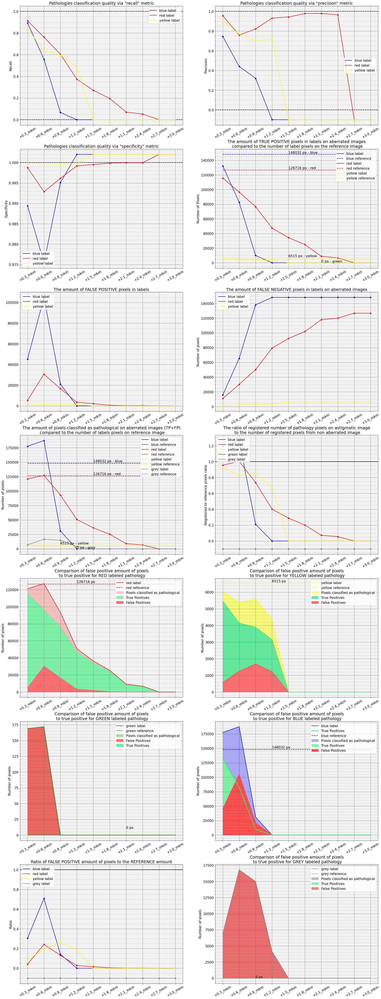

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as tck

font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 16}

plt.rc('font', **font)

plotrows = 7
plotcols = 2

f = plt.figure(figsize = (plotcols * 15, plotrows * 12))
rot_angle = 30

####
ax1 = f.add_subplot(plotrows, plotcols, 1)
ax1.set_title('Pathologies classification quality via "recall" metric')
ax1.set_ylabel('Recall')
ax1.set_xticklabels(im_names, rotation = rot_angle)
ax1.grid(which = 'major', color = '#666666')
ax1.set_facecolor('#F1F1F1')
ax1.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax1.grid(which = 'minor', linestyle = 'dashed')
ax1.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')
ax1.axhline(0.0, color = 'black', linewidth = 2, linestyle = 'dashed')

####
ax2 = f.add_subplot(plotrows, plotcols, 2)
ax2.set_title('Pathologies classification quality via "precision" metric')
ax2.set_ylabel('Precision')
ax2.set_xticklabels(im_names, rotation = rot_angle)
ax2.grid(which = 'major', color = '#666666')
ax2.set_facecolor('#F1F1F1')
ax2.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax2.grid(which = 'minor', linestyle = 'dashed')
ax2.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')
ax2.axhline(0.0, color = 'black', linewidth = 2, linestyle = 'dashed')

ax3 = f.add_subplot(plotrows, plotcols, 3)
ax3.set_title('Pathologies classification quality via "specificity" metric')
ax3.set_ylabel('Specificity')
ax3.set_xticklabels(im_names, rotation = rot_angle)
ax3.grid(which = 'major', color = '#666666')
ax3.set_facecolor('#F1F1F1')
ax3.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax3.grid(which = 'minor', linestyle = 'dashed')
ax3.axhline(1.0, color = 'black', linewidth = 2, linestyle = 'dashed')

ax4 = f.add_subplot(plotrows, plotcols, 4)
ax4.set_title('The amount of TRUE POSITIVE pixels in labels on aberrated images\n compared to the number of label pixels on the reference image')
ax4.set_ylabel('Number of Pixels')
ax4.set_xticklabels(im_names, rotation = rot_angle)
ax4.grid(which = 'major', color = '#666666')
ax4.set_facecolor('#F1F1F1')
ax4.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax4.grid(which = 'minor', linestyle = 'dashed')
ax4.text(4, 149000, '148032 px - blue')
ax4.text(4, 128000, '126716 px - red')
ax4.text(4, 8000, '6515 px - yellow')
ax4.text(6, 500, '0 px - green')
#ax4.axhline(0.0, color = 'black', linewidth = 2)
#ax4.set_yscale('log')

ax5 = f.add_subplot(plotrows, plotcols, 5)
ax5.set_title('The amount of FALSE POSITIVE pixels in labels')
ax5.set_xticklabels(im_names, rotation = rot_angle)
ax5.grid(which = 'major', color = '#666666')
ax5.set_facecolor('#F1F1F1')
ax5.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax5.grid(which = 'minor', linestyle = 'dashed')

ax6 = f.add_subplot(plotrows, plotcols, 6)
ax6.set_title('The amount of FALSE NEGATIVE pixels in labels on aberrated images')
ax6.set_ylabel('Number of pixels')
ax6.set_xticklabels(im_names, rotation = rot_angle)
ax6.grid(which = 'major', color = '#666666')
ax6.set_facecolor('#F1F1F1')
ax6.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax6.grid(which = 'minor', linestyle = 'dashed')

####
ax7 = f.add_subplot(plotrows, plotcols, 7)
ax7.set_title('The amount of pixels classified as pathological on aberrated images (TP+FP)\n compared to the number of labels pixels on reference image')
ax7.set_ylabel('Number of pixels')
ax7.set_xticklabels(im_names, rotation = rot_angle)
ax7.grid(which = 'major', color = '#666666')
ax7.set_facecolor('#F1F1F1')
ax7.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax7.text(4, 150000, '148032 px - blue')
ax7.text(4, 128000, '126716 px - red')
ax7.text(2, 8000, '6515 px - yellow')
ax7.text(3, 500, '0 px - grey')
ax7.grid(which = 'minor', linestyle = 'dashed')

####
ax8 = f.add_subplot(plotrows, plotcols, 8)
ax8.set_title('The ratio of registered number of pathology pixels on astigmatic image\n to the number of registered pixels from non aberrated image')
ax8.set_ylabel('Registered to reference pixels ratio')
ax8.set_xticklabels(im_names, rotation = rot_angle)
ax8.grid(which = 'major', color = '#666666')
ax8.set_facecolor('#F1F1F1')
ax8.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax8.grid(which = 'minor', linestyle = 'dashed')
ax8.axhline(1.0, color = 'black', linewidth = 2)

####
ax9 = f.add_subplot(plotrows, plotcols, 9)
ax9.set_title('Comparison of false positive amount of pixels\n to true positive for RED labeled pathology')
ax9.set_ylabel('Number of pixels')
ax9.set_xticklabels(im_names, rotation = rot_angle)
ax9.grid(which = 'major', color = '#666666')
ax9.set_facecolor('#F1F1F1')
ax9.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax9.grid(which = 'minor', linestyle = 'dashed')

####
ax10 = f.add_subplot(plotrows, plotcols, 14)
ax10.set_title('Comparison of false positive amount of pixels\n to true positive for GREY labeled pathology')
ax10.set_ylabel('Number of pixels')
ax10.set_xticklabels(im_names, rotation = rot_angle)
ax10.grid(which = 'major', color = '#666666')
ax10.set_facecolor('#F1F1F1')
ax10.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax10.grid(which = 'minor', linestyle = 'dashed')

####
ax11 = f.add_subplot(plotrows, plotcols, 10)
ax11.set_title('Comparison of false positive amount of pixels\n to true positive for YELLOW labeled pathology')
ax11.set_ylabel('Number of pixels')
ax11.set_xticklabels(im_names, rotation = rot_angle)
ax11.grid(which = 'major', color = '#666666')
ax11.set_facecolor('#F1F1F1')
ax11.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax11.grid(which = 'minor', linestyle = 'dashed')

####
ax12 = f.add_subplot(plotrows, plotcols, 11)
ax12.set_title('Comparison of false positive amount of pixels\n to true positive for GREEN labeled pathology')
ax12.set_ylabel('Number of pixels')
ax12.set_xticklabels(im_names, rotation = rot_angle)
ax12.grid(which = 'major', color = '#666666')
ax12.set_facecolor('#F1F1F1')
ax12.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax12.grid(which = 'minor', linestyle = 'dashed')

####
#ax13 = f.add_subplot(plotrows, plotcols, 13)
#ax13.set_title('Comparison of false positive amount of pixels\n to true positive for BLACK labeled pathology')
#ax13.set_ylabel('Number of pixels')
#ax13.set_yscale('log')
#ax13.set_xticklabels(im_names, rotation = rot_angle)
#ax13.grid(which = 'major', color = '#666666')
#ax13.set_facecolor('#F1F1F1')
#ax13.yaxis.set_minor_locator(tck.AutoMinorLocator())
#ax13.grid(which = 'minor', linestyle = 'dashed')

#ax14 = f.add_subplot(plotrows, plotcols, 14)
#ax14.set_title('The ratio of registered number of pathology pixels on astigmatic image\n to the number of registered pixels from non aberrated image WITH BLACK LABELS')
#ax14.set_ylabel('Registered to reference pixels ratio')
#ax14.set_xticklabels(im_names, rotation = rot_angle)
#ax14.grid(which = 'major', color = '#666666')
#ax14.set_facecolor('#F1F1F1')
#ax14.yaxis.set_minor_locator(tck.AutoMinorLocator())
#ax14.grid(which = 'minor', linestyle = 'dashed')
#ax14.axhline(1.0, color = 'black', linewidth = 2)

#ax15 = f.add_subplot(plotrows, plotcols, 15)
#ax15.set_title('The amount of TRUE POSITIVE pixels in labels on aberrated images\n compared to the number of label pixels on the reference image ONLY BLACK and GREEN')
#ax15.set_ylabel('Number of Pixels')
#ax15.set_xticklabels(im_names, rotation = rot_angle)
#ax15.grid(which = 'major', color = '#666666')
#ax15.set_facecolor('#F1F1F1')
#ax15.yaxis.set_minor_locator(tck.AutoMinorLocator())
#ax15.grid(which = 'minor', linestyle = 'dashed')
#ax15.text(4, 770, '765 px')
#ax15.text(4, 460, '444 px')

ax16 = f.add_subplot(plotrows, plotcols, 12)
ax16.set_title('Comparison of false positive amount of pixels\n to true positive for BLUE labeled pathology')
ax16.set_ylabel('Number of pixels')
ax16.set_xticklabels(im_names, rotation = rot_angle)
ax16.grid(which = 'major', color = '#666666')
ax16.set_facecolor('#F1F1F1')
ax16.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax16.grid(which = 'minor', linestyle = 'dashed')

ax17 = f.add_subplot(plotrows, plotcols, 13)
ax17.set_title('Ratio of FALSE POSITIVE amount of pixels to the REFERENCE amount')
ax17.set_ylabel('Ratio')
ax17.set_xticklabels(im_names, rotation = rot_angle)
ax17.grid(which = 'major', color = '#666666')
ax17.set_facecolor('#F1F1F1')
ax17.yaxis.set_minor_locator(tck.AutoMinorLocator())
ax17.grid(which = 'minor', linestyle = 'dashed')
ax17.axhline(1.0, color = 'black', linewidth = 2)

for j in range(len(colours_for_countpixels)):

  recall = []
  precision = []
  specificity = []
  TP = []
  FP = []
  FN = []
  registered_pixels = []
  reference_pixels = []
  ratio = []
  ratio_2 = []

  for i in range(len(data[colours_for_countpixels[j]])):

    recall.append(data[colours_for_countpixels[j]][i]['Recall'])
    precision.append(data[colours_for_countpixels[j]][i]['Precision'])
    if data[colours_for_countpixels[j]][i]['Specificity'] == 1:
      specificity.append(data[colours_for_countpixels[j]][i]['Specificity'] + 0.002)
    else:
      specificity.append(data[colours_for_countpixels[j]][i]['Specificity'])
    TP.append(data[colours_for_countpixels[j]][i]['TP'])
    FP.append(data[colours_for_countpixels[j]][i]['FP'])
    FN.append(data[colours_for_countpixels[j]][i]['FN'])
    registered_pixels.append(data[colours_for_countpixels[j]][i]['Registered_pixels'])
    reference_pixels.append(data[colours_for_countpixels[j]][i]['Reference_pixels'])
    if data[colours_for_countpixels[j]][i]['Reference_pixels'] != 0:
      ratio.append(data[colours_for_countpixels[j]][i]['Registered_pixels']/data[colours_for_countpixels[j]][i]['Reference_pixels'])
      ratio_2.append(data[colours_for_countpixels[j]][i]['FP']/data[colours_for_countpixels[j]][i]['Reference_pixels'])
    else:
      ratio.append(-0.1)
      ratio_2.append(-0.1)

  if (colours_for_countpixels[j] != 'green') and  (colours_for_countpixels[j] != "grey"):

    ax1.plot(im_names, recall, 'o', color = colours_for_countpixels[j])
    ax1.plot(im_names, recall, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax1.legend(loc = 'upper right')

    ax2.plot(im_names, precision, 'o', color = colours_for_countpixels[j])
    ax2.plot(im_names, precision, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax2.legend(loc = 'center right')

    ax3.plot(im_names, specificity, 'o', color = colours_for_countpixels[j])
    ax3.plot(im_names, specificity, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax3.legend(loc = 'lower left')

    ax4.plot(im_names, TP, 'o', color = colours_for_countpixels[j])
    ax4.plot(im_names, TP, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax4.plot(im_names, reference_pixels, '--', color = colours_for_countpixels[j], linewidth = 2, label = '{0} reference'.format(colours_for_countpixels[j]))
    ax4.legend(loc = 'upper right')

    ax5.plot(im_names, FP, 'o', color = colours_for_countpixels[j])
    ax5.plot(im_names, FP, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax5.legend(loc = 'upper left')

    ax6.plot(im_names, FN, 'o', color = colours_for_countpixels[j])
    ax6.plot(im_names, FN, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax6.legend(loc = 'upper left')

  if colours_for_countpixels[j] != 'green':

    ax7.plot(im_names, registered_pixels, 'o', color = colours_for_countpixels[j])
    ax7.plot(im_names, registered_pixels, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax7.plot(im_names, reference_pixels, '--', color = colours_for_countpixels[j], linewidth = 2, label = '{0} reference'.format(colours_for_countpixels[j]))
    ax7.legend(loc = 'upper right')

  if colours_for_countpixels[j] != 'black':

    ax8.plot(im_names, ratio, 'o', color = colours_for_countpixels[j])
    ax8.plot(im_names, ratio, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax8.legend(loc = 'upper left')

  if colours_for_countpixels[j] == 'red':

    ax9.plot(im_names, registered_pixels, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax9.plot(im_names, FP, color = '#FE4B4B', linewidth = 2, alpha = 0.0)
    ax9.plot(im_names, TP, color = '#2BF173', linewidth = 2, alpha = 0.0)

    ax9.fill_between(im_names, registered_pixels, TP, color = 'red', label = 'Pixels classified as pathological', alpha = 0.2)
    ax9.fill_between(im_names, TP, FP, color = '#2BF173', label = 'True Positives', alpha = 0.6)   
    ax9.fill_between(im_names, FP, color = '#FE4B4B', label = 'False Positives', alpha = 0.8) 

#    ax9.plot(im_names, FN, color = 'black', linewidth = 2, alpha = 0.8, label = 'False Negatives')  
      

    ax9.plot(im_names, reference_pixels, '--', color = colours_for_countpixels[j], linewidth = 2, label = '{0} reference'.format(colours_for_countpixels[j]))
    ax9.text(3, 128000, '126716 px')
    ax9.legend(loc = 'upper right')

  if colours_for_countpixels[j] == 'grey':

    ax10.plot(im_names, registered_pixels, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax10.plot(im_names, FP, color = '#FE4B4B', linewidth = 2, alpha = 0.0)
    ax10.plot(im_names, TP, color = '#2BF173', linewidth = 2, alpha = 0.0)

    ax10.fill_between(im_names, registered_pixels, color = 'grey', label = 'Pixels classified as pathological', alpha = 0.5)
    ax10.fill_between(im_names, TP, color = '#2BF173', label = 'True Positives', alpha = 0.55)   
    ax10.fill_between(im_names, FP, color = '#FE4B4B', label = 'False Positives', alpha = 0.7)   

    ax10.plot(im_names, reference_pixels, '--', color = colours_for_countpixels[j], linewidth = 2, label = '{0} reference'.format(colours_for_countpixels[j]))
    ax10.text(2, 20, '0 px')
    ax10.legend(loc = 'upper right')

  if colours_for_countpixels[j] == 'yellow':

    ax11.plot(im_names, registered_pixels, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax11.plot(im_names, FP, color = '#FE4B4B', linewidth = 2, alpha = 1.0)
    ax11.plot(im_names, TP, color = '#2BF173', linewidth = 2, alpha = 1.0)

    ax11.fill_between(im_names, TP, registered_pixels, color = 'yellow', label = 'Pixels classified as pathological', alpha = 0.5)
    ax11.fill_between(im_names, TP, FP, color = '#00E263', label = 'True Positives', alpha = 0.6)   
    ax11.fill_between(im_names, FP, color = '#FE4B4B', label = 'False Positives', alpha = 0.8)   

    ax11.plot(im_names, reference_pixels, '--', color = colours_for_countpixels[j], linewidth = 2, label = '{0} reference'.format(colours_for_countpixels[j]))
    ax11.text(3, 6600, '6515 px')
    ax11.legend(loc = 'upper right')

  if colours_for_countpixels[j] == 'green':

    ax12.plot(im_names, registered_pixels, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax12.plot(im_names, FP, color = '#FE4B4B', linewidth = 2, alpha = 0.0)
    ax12.plot(im_names, TP, color = '#2BF173', linewidth = 2, alpha = 0.0)

    ax12.fill_between(im_names, registered_pixels, color = 'green', label = 'Pixels classified as pathological', alpha = 0.3)   
    ax12.fill_between(im_names, FP, color = '#FE4B4B', label = 'False Positives', alpha = 0.8)   
    ax12.fill_between(im_names, TP, color = '#2BF173', label = 'True Positives', alpha = 0.8)

    ax12.plot(im_names, reference_pixels, '--', color = colours_for_countpixels[j], linewidth = 2, label = '{0} reference'.format(colours_for_countpixels[j]))
    ax12.text(6, 10, '0 px')
    ax12.legend(loc = 'upper right')

#  if colours_for_countpixels[j] == 'black':
#
#    ax13.plot(im_names, registered_pixels, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
#    ax13.plot(im_names, FP, color = '#FE4B4B', linewidth = 2, alpha = 0.0)
#    ax13.plot(im_names, TP, color = '#2BF173', linewidth = 2, alpha = 0.0)
#
#    ax13.fill_between(im_names, registered_pixels, color = 'black', label = 'Pixels classified as pathological', alpha = 0.6)   
#    ax13.fill_between(im_names, FP, color = '#FE4B4B', label = 'False Positives', alpha = 0.8)   
#    ax13.fill_between(im_names, TP, color = '#2BF173', label = 'True Positives', alpha = 0.8)
#
#    ax13.plot(im_names, reference_pixels, '--', color = colours_for_countpixels[j], linewidth = 2, label = '{0} reference'.format(colours_for_countpixels[j]))
#    ax13.text(1, 550, '444 px')
#    ax13.text(0, 3000, 'only 5 TP pixels\n on -0.3 mkm abb')
#    ax13.legend(loc = 'lower right')

#  ax14.plot(im_names, ratio, 'o', color = colours_for_countpixels[j])
#  ax14.plot(im_names, ratio, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
#  ax14.legend(loc = 'upper left')

#  if colours_for_countpixels[j] == 'green' or colours_for_countpixels[j] == 'black':
#  
#    ax15.plot(im_names, TP, 'o', color = colours_for_countpixels[j])
#    ax15.plot(im_names, TP, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
#    ax15.plot(im_names, reference_pixels, '--', color = colours_for_countpixels[j], linewidth = 2, label = '{0} reference'.format(colours_for_countpixels[j]))
#    ax15.legend(loc = 'upper right')

  if colours_for_countpixels[j] == 'blue':

    ax16.plot(im_names, registered_pixels, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax16.plot(im_names, FP, color = '#FE4B4B', linewidth = 3, alpha = 1.0)
    ax16.plot(im_names, TP, color = '#2BF173', linewidth = 3, label = 'True Positives', alpha = 1.0)

    ax16.fill_between(im_names[0:2], registered_pixels[0:2], TP[0:2], color = 'blue', label = 'Pixels classified as pathological', alpha = 0.3)
    ax16.fill_between(im_names[1:10], registered_pixels[1:10], FP[1:10], color = 'blue', alpha = 0.3)
    ax16.fill_between(im_names[0:2], TP[0:2], FP[0:2], color = '#2BF173', label = 'True Positives', alpha = 0.6)
    ax16.fill_between(im_names, FP, color = '#FE4B4B', label = 'False Positives', alpha = 1.0)
 #  ax16.fill_between(im_names[1:], FP[1:], color = '#FE4B4B', alpha = 0.8)
 #  ax16.fill_between(im_names[1:], TP[1:], color = '#2BF173', alpha = 0.6)
 #  ax16.fill_between(im_names[4:6], TP[4:6], FP[4:6], color = '#2BF173', label = 'True Positives', alpha = 0.6)



    ax16.plot(im_names, reference_pixels, '--', color = colours_for_countpixels[j], linewidth = 2, label = '{0} reference'.format(colours_for_countpixels[j]))
    ax16.text(3, 150000, '148032 px')
    ax16.legend(loc = 'upper right')

  if colours_for_countpixels[j] != 'green':

    ax17.plot(im_names, ratio_2, 'o', color = colours_for_countpixels[j])
    ax17.plot(im_names, ratio_2, color = colours_for_countpixels[j], linewidth = 2, label = '{0} label'.format(colours_for_countpixels[j]))
    ax17.legend(loc = 'upper left')
    

plt.savefig(folder + '_plots_vol_{0}.pdf'.format(2))
plt.savefig(folder + '_plots_vol_{0}.png'.format(2))

plt.show()